In [19]:
# import
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import torch
import torch.nn as nn
import time
from torch.utils.data import Dataset,DataLoader
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torchvision.io import read_image
import pathlib
from torchvision import transforms
from PIL import Image
import random 
torch.cuda.is_available()
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

## Step 1

In [2]:
if not os.path.exists("data/train"):
        os.makedirs("data/train")
if not os.path.exists("data/test"):
        os.makedirs("data/test")    

In [3]:
images = list(pathlib.Path('VOC2007/JPEGImages').glob("*.jpg"))
border = int(len(images))

for i in range(1000):
    image_path = images[i]
    image = Image.open(image_path)
    image.save(f"data/test/{i}.jpg")
    
for i in range(1000, len(images)):
    image_path = images[i]
    image = Image.open(image_path)
    image.save(f"data/train/{i}.jpg")

In [4]:
class SeperResolutionDataset(Dataset):
    def __init__(self, target_dir):

        self.paths = list(pathlib.Path(target_dir).glob("*.jpg"))

        self.YLargeTransforms = transforms.Compose([
                                    transforms.Resize(size=(288,288)),
                                    transforms.ToTensor()
                                  ])
        
        self.YMidTransforms = transforms.Compose([
                                    transforms.Resize(size=(144,144)),
                                    transforms.ToTensor()
                                  ])
        
        self.XTransforms = transforms.Compose([
                                    transforms.Resize(size=(72,72)),
                                    transforms.ToTensor()
                                  ])
        

    def __len__(self):
        # length of directory
        return len(self.paths)
    
    def load_image(self,idx):
        # open in image in certain index and return it
        image_path = self.paths[idx]
        return Image.open(image_path)

    def __getitem__(self,idx):

        image = self.load_image(idx)

        YLarge = self.YLargeTransforms(image)
        YMid = self.YMidTransforms(image)
        X = self.XTransforms(image)
        
        return X, YMid, YLarge
    


In [5]:
train_dataset = SeperResolutionDataset("data/train")
test_dataset = SeperResolutionDataset("data/test")

In [6]:
print(len(train_dataset))
print(len(test_dataset))

4011
1000


In [7]:
import random
def display_image(dataset,images_num=3):
    plt.figure(figsize=(26,10*images_num))
    indxs = []
    for i in range(images_num):
        indxs.append(random.randint(0,len(dataset)))
    for i, idx in enumerate(indxs):
        for j in range(len(dataset[idx])):
            targ_img = dataset[idx][j]
            targ_img_adjust = targ_img.permute(1,2,0)
            plt.subplot(images_num,3,(i*3)+j+1)
            title = f"\nshape: {targ_img_adjust.shape}"
            plt.title(title)
            plt.imshow(targ_img_adjust)

        

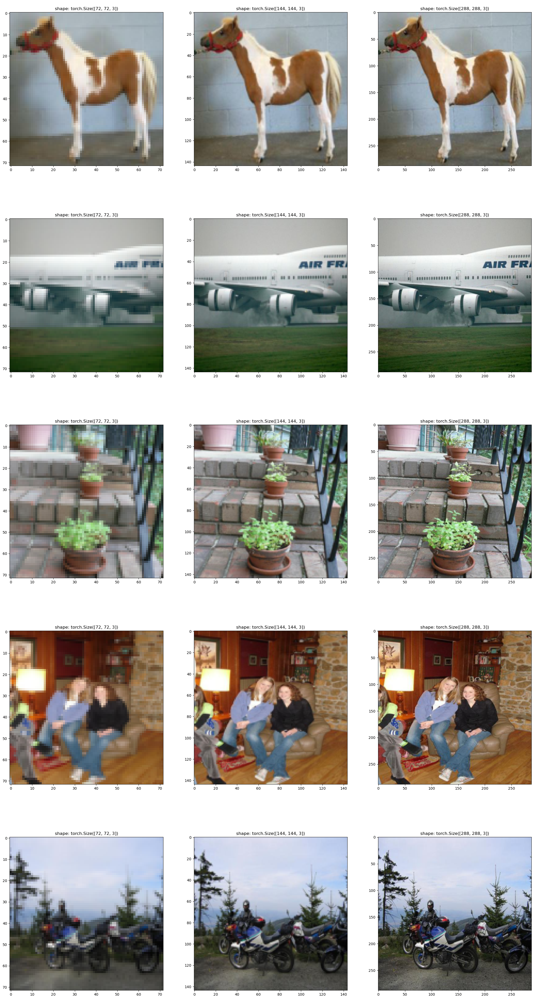

In [11]:
display_image(train_dataset, images_num=5)

## Step 2 - 72 To 144

In [207]:
class FullConv72To144(nn.Module):
    def __init__(self):
        super(FullConv72To144, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 64, 3, padding='same')
        # convolutional layer (sees 64x72x72 tensor)
        self.conv2 = nn.Conv2d(64, 64, 3, padding='same')
        # output tensor size is 64x72x72

        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        
        self.conv3 = nn.Conv2d(64, 3, 1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        # 64x72x72
        x = self.leakyRelu(self.conv2(x))
        
        # 64x72x72
        x = self.upsample(x)

        # 64x144x144
        x = self.conv3(x)
        
        # 3x144x144

        return x
    
model72To144 = FullConv72To144().to(device)
model72To144

FullConv72To144(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (upsample): Upsample(scale_factor=2.0, mode=nearest)
  (conv3): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (leakyRelu): LeakyReLU(negative_slope=0.1)
)

In [208]:
def train_loop(data_loader,model,device,loss_fn,optimizer,print_every_n=5):
    model.train()
    size = len(data_loader.sampler)
    num_batches = len(data_loader)
    train_loss=0
    for batch,(X,YMid,YLarge) in enumerate(data_loader):
        X = X.to(device)
        YMid = YMid.to(device)
        pred = model(X)
        loss = loss_fn(pred,YMid)
        train_loss += loss
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        if batch%print_every_n==0:
            loss, current = loss.item(), batch*len(X)
            print(f'loss={loss:.3f}, {current} samples / {size}')
        
    train_loss /= num_batches

        
    return train_loss

In [209]:
def val_loop(data_loader,model,device,loss_fn):
    model.eval()
    num_batches = len(data_loader)
    size=len(data_loader.sampler)
    test_loss=0
    with torch.no_grad():
        for batch,(X,YMid,YLarge) in enumerate(data_loader):
            X = X.to(device)
            YMid = YMid.to(device)
            pred = model(X)
            test_loss += loss_fn(pred,YMid).item()
            
            if batch == num_batches - 1:
                valImage = pred.cpu().detach()[0].permute(1,2,0)
        
    test_loss /= num_batches
    return test_loss, valImage        

In [7]:
from torchmetrics.functional import peak_signal_noise_ratio

class PSNRLoss(nn.Module):
    def __init__(self, psnrRatio):
        super(PSNRLoss, self).__init__()
        self.loss_fun = peak_signal_noise_ratio
        self.psnrRatio = psnrRatio
        
    def __call__(self, predictions, target):
        psnr = self.loss_fun(predictions, target, data_range=1.0)
        return self.psnrRatio / psnr 


In [211]:
learning_rate = 0.001
epochs = 5
batch_size = 64
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(model72To144.parameters(),lr=learning_rate)

In [212]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,model72To144,device,loss_fn,optimizer)


    val_loss, valImg144 = val_loop(test_loader,model72To144,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    

Starting epoch 1
loss=0.143, 0 samples / 4011
loss=0.061, 320 samples / 4011
loss=0.054, 640 samples / 4011
loss=0.057, 960 samples / 4011
loss=0.049, 1280 samples / 4011
loss=0.049, 1600 samples / 4011
loss=0.049, 1920 samples / 4011
loss=0.047, 2240 samples / 4011
loss=0.046, 2560 samples / 4011
loss=0.046, 2880 samples / 4011
loss=0.044, 3200 samples / 4011
loss=0.044, 3520 samples / 4011
loss=0.043, 3840 samples / 4011
Epoch:1/5 AVG Training Loss:0.053 AVG Val Loss:0.043
Starting epoch 2
loss=0.042, 0 samples / 4011
loss=0.042, 320 samples / 4011
loss=0.041, 640 samples / 4011
loss=0.041, 960 samples / 4011
loss=0.040, 1280 samples / 4011
loss=0.041, 1600 samples / 4011
loss=0.040, 1920 samples / 4011
loss=0.039, 2240 samples / 4011
loss=0.039, 2560 samples / 4011
loss=0.040, 2880 samples / 4011
loss=0.039, 3200 samples / 4011
loss=0.039, 3520 samples / 4011
loss=0.038, 3840 samples / 4011
Epoch:2/5 AVG Training Loss:0.040 AVG Val Loss:0.039
Starting epoch 3
loss=0.038, 0 samples /

In [213]:
import imageio
def save_model_process(modelDescreption, images144, images288=None):
    imageio.mimsave(modelDescreption + 'Animation144.gif', images144, 'GIF', duration=0.3)
    if images288 is not None:
        imageio.mimsave(modelDescreption + 'Animation288.gif', images288, 'GIF', duration=0.3)


In [214]:
save_model_process('model144', images144)

Lossy conversion from float32 to uint8. Range [0.024026617407798767, 1.0280646085739136]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0019323406741023064, 1.059304118156433]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0.0023541823029518127, 1.0500476360321045]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-6.383657455444336e-05, 1.0402824878692627]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.0032544583082199097, 1.0310945510864258]. Convert image to uint8 prior to saving to suppress this warning.


In [168]:
def visualize_model_144(model, test_dataset, num_images = 4):
    test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=1)
    indxs = []
    for i in range(num_images):
        indxs.append(random.randint(0,len(test_dataset)))
    was_training = model.training
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(26,10*num_images))
    with torch.no_grad():
        for i, (Xs, Y1s, Y2s) in enumerate(test_loader):
            if i in indxs:
                inputs = Xs.to(device)
                predicted144 = model(inputs)

                plt.figure(figsize=(15,15))
                
                plt.subplot(1, 3, 1)
                plt.title(f'actual 72x72:')
                plt.imshow(Xs[0].permute(1,2,0))
                
                plt.subplot(1, 3, 2)
                plt.title(f'actual 144x144:')
                plt.imshow(Y1s[0].permute(1,2,0))
                
                plt.subplot(1, 3, 3)
                plt.title(f'actual 288x288:')
                plt.imshow(Y2s[0].permute(1,2,0))
                
                plt.show()
                plt.figure(figsize=(15,15))
                plt.subplot(1, 3, 2)
                psnr = peak_signal_noise_ratio(predicted144.cpu()[0],Y1s[0])
                plt.title("predicted 144x144: Psnr: {:.2f}".format(psnr))
                plt.imshow(predicted144.cpu()[0].permute(1,2,0))
                plt.show()
                images_so_far += 1
                
            if images_so_far == num_images -1:
                model.train(mode=was_training)
                return
        model.train(mode=was_training)

<Figure size 2600x4000 with 0 Axes>

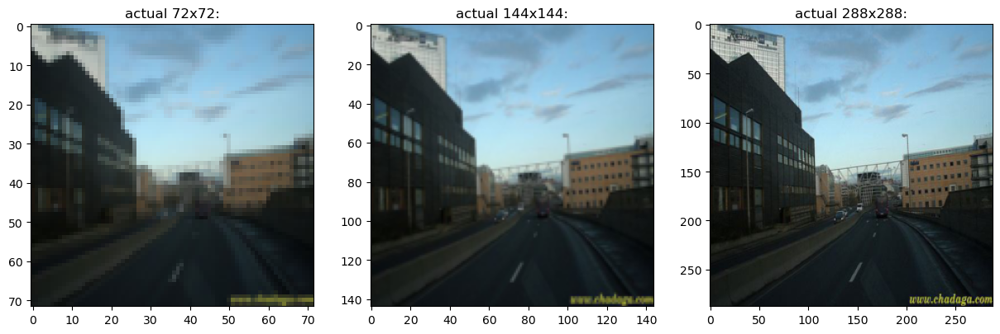

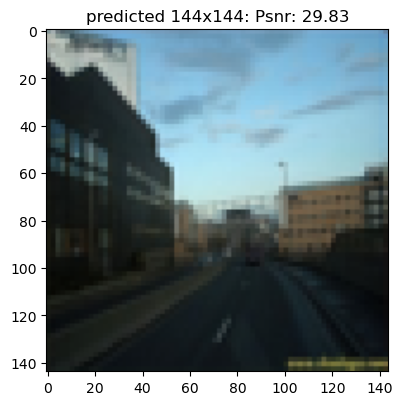

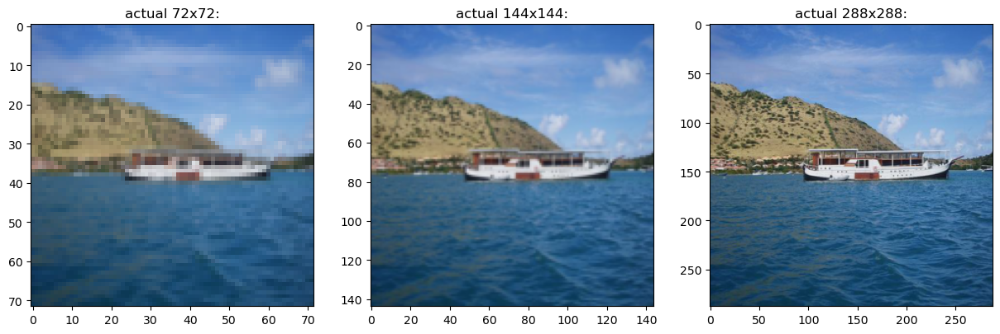

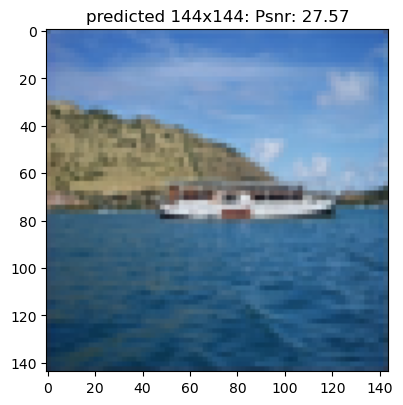

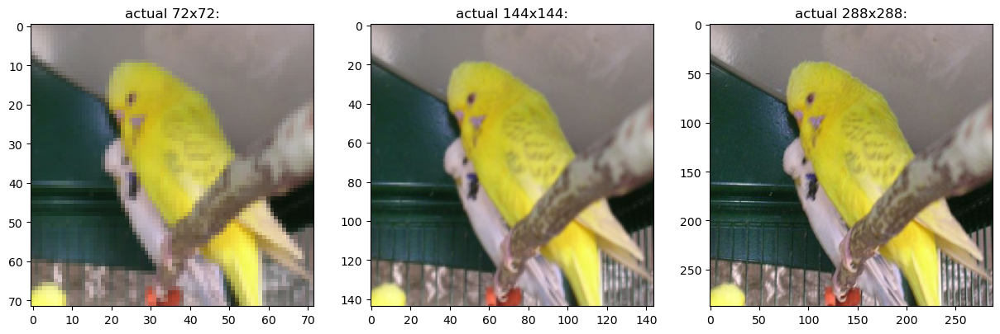

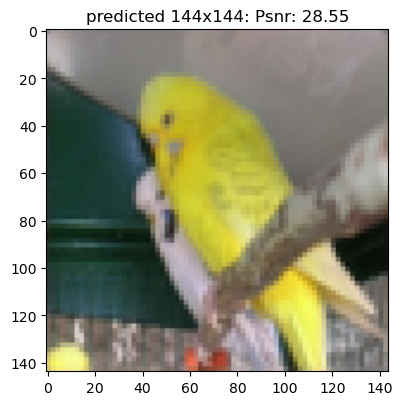

In [215]:
visualize_model_144(model72To144, test_dataset)

## Step 3 72 To 288

In [216]:
class FullConv72To288(nn.Module):
    def __init__(self):
        super(FullConv72To288, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 64, 3, padding='same')
        # convolutional layer (sees 64x72x72 tensor)
        self.conv2 = nn.Conv2d(64, 64, 3, padding='same')
        # output tensor size is 64x72x72

        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        
        self.conv3 = nn.Conv2d(64, 3, 1, padding='same')
        
        self.conv4 = nn.Conv2d(64, 3, 1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        # 64x72x72
        x = self.leakyRelu(self.conv2(x))
        
        # 64x72x72
        x = self.upsample(x)

        # 64x144x144
        x144 = self.conv3(x)
        # 3x144x144
        
        # 64x144x144
        x288 = self.upsample(x)
  
        # 64x288x288
        x288 = self.conv4(x288)
        # 3x288x288
    
        return x144, x288
    
model72To288 = FullConv72To288().to(device)
model72To288

FullConv72To288(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (upsample): Upsample(scale_factor=2.0, mode=nearest)
  (conv3): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (conv4): Conv2d(64, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (leakyRelu): LeakyReLU(negative_slope=0.1)
)

In [8]:
def train_loop(data_loader,model,device,loss_fn,optimizer,print_every_n=20):
    model.train()
    size = len(data_loader.sampler)
    num_batches = len(data_loader)
    train_loss=0
    for batch, (X, YMid, YLarge) in enumerate(data_loader):
        X = X.to(device, dtype=torch.float)
        YMid = YMid.to(device, dtype=torch.float)
        YLarge = YLarge.to(device, dtype=torch.float)
        predMid, predLarge = model(X)
        lossMid = loss_fn(predMid, YMid)
        lossLarge = loss_fn(predLarge, YLarge)
        optimizer.zero_grad()
        loss = lossMid+lossLarge
        loss.backward()
        optimizer.step()

        train_loss += lossMid
        train_loss += lossLarge

        if batch%print_every_n==0:
            lossMid, current = lossMid.item(), batch*len(X)
            print(f'loss={lossMid:.3f}, {current} samples / {size}')
        
    train_loss /= num_batches

        
    return train_loss

In [9]:
def val_loop(data_loader,model,device,loss_fn):
    model.eval()
    num_batches = len(data_loader)
    size=len(data_loader.sampler)
    test_loss=0
    with torch.no_grad():
        for batch,(X,YMid,YLarge) in enumerate(data_loader):
            X = X.to(device, dtype=torch.float)
            YMid = YMid.to(device, dtype=torch.float)
            YLarge = YLarge.to(device, dtype=torch.float)
            predMid, predLarge = model(X)
            lossMid = loss_fn(predMid,YMid)
            lossLarge = loss_fn(predLarge,YLarge)
            test_loss += lossMid
            test_loss += lossLarge
            
            if batch == num_batches - 1:
                img144 = predMid.cpu().data[0].permute(1,2,0)
                img288 = predLarge.cpu().data[0].permute(1,2,0)
            

    test_loss /= num_batches
    return test_loss, img144, img288     

In [221]:
learning_rate = 0.001
epochs = 3
batch_size = 64
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(model72To288.parameters(),lr=learning_rate)

In [223]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,model72To288,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,model72To288,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.135, 0 samples / 4011
loss=0.051, 1280 samples / 4011
loss=0.046, 2560 samples / 4011
loss=0.041, 3840 samples / 4011
Epoch:1/3 AVG Training Loss:0.111 AVG Val Loss:0.087
Starting epoch 2
loss=0.040, 0 samples / 4011
loss=0.039, 1280 samples / 4011
loss=0.039, 2560 samples / 4011
loss=0.038, 3840 samples / 4011
Epoch:2/3 AVG Training Loss:0.084 AVG Val Loss:0.082
Starting epoch 3
loss=0.038, 0 samples / 4011
loss=0.038, 1280 samples / 4011
loss=0.038, 2560 samples / 4011
loss=0.038, 3840 samples / 4011
Epoch:3/3 AVG Training Loss:0.082 AVG Val Loss:0.081


In [224]:
save_model_process('model288', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.06200695037841797, 1.121180772781372]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.03238557651638985, 1.0829014778137207]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.01572951301932335, 1.0690089464187622]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.017422426491975784, 1.1659997701644897]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.01556263118982315, 1.1014513969421387]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.019560540094971657, 1.0724685192108154]. Convert image to uint8 prior to saving to suppress this warning.


In [25]:
def evaluatePSNR(model, test_dataset):
    test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=4)
    indxs = []
    was_training = model.training
    model.eval()
    psnr144 = 0
    psnr288 = 0
    with torch.no_grad():
        for i, (Xs, Y1s, Y2s) in enumerate(test_loader):
            inputs = Xs.to(device)
            predicted144, predicted288 = model(inputs)
            psnr144 += (peak_signal_noise_ratio(predicted144.cpu()[0],Y1s[0]) / len(test_loader))
            psnr288 += (peak_signal_noise_ratio(predicted288.cpu()[0],Y2s[0]) / len(test_loader))
                
        model.train(mode=was_training)
        
        print(f"Average PSNR for 144x144: {psnr144}")
        print(f"Average PSNR for 288x288: {psnr288}")

In [11]:
def visualize_model_288(model, test_dataset, num_images = 4):
    test_loader = torch.utils.data.DataLoader(test_dataset,batch_size=1)
    indxs = []
    for i in range(num_images):
        indxs.append(random.randint(0,len(test_dataset)))
    was_training = model.training
    model.eval()
    images_so_far = 0
    plt.figure(figsize=(26,10*num_images))
    with torch.no_grad():
        for i, (Xs, Y1s, Y2s) in enumerate(test_loader):
            if i in indxs:
                inputs = Xs.to(device)
                predicted144, predicted288 = model(inputs)

                plt.figure(figsize=(15,15))
                
                plt.subplot(1, 3, 1)
                plt.title(f'actual 72x72:')
                plt.imshow(Xs[0].permute(1,2,0))
                
                plt.subplot(1, 3, 2)
                plt.title(f'actual 144x144:')
                plt.imshow(Y1s[0].permute(1,2,0))
                
                plt.subplot(1, 3, 3)
                plt.title(f'actual 288x288:')
                plt.imshow(Y2s[0].permute(1,2,0))
                
                plt.show()
                plt.figure(figsize=(15,15))
                plt.subplot(1, 3, 2)
                psnr = peak_signal_noise_ratio(predicted144.cpu()[0],Y1s[0])
                plt.title("predicted 144x144: Psnr: {:.2f}".format(psnr))
                plt.imshow(predicted144.cpu()[0].permute(1,2,0))
            
                plt.subplot(1, 3, 3)
                psnr = peak_signal_noise_ratio(predicted288.cpu()[0],Y2s[0])
                plt.title("predicted 288x288: Psnr: {:.2f}".format(psnr))
                plt.imshow(predicted288.cpu()[0].permute(1,2,0))

                images_so_far += 1
                
            if images_so_far == num_images -1:
                model.train(mode=was_training)
                return
        model.train(mode=was_training)

In [339]:
evaluatePSNR(model72To288, test_dataset)

Average PSNR for 144x144: 26.47386360168457
Average PSNR for 288x288: 23.754810333251953


<Figure size 2600x4000 with 0 Axes>

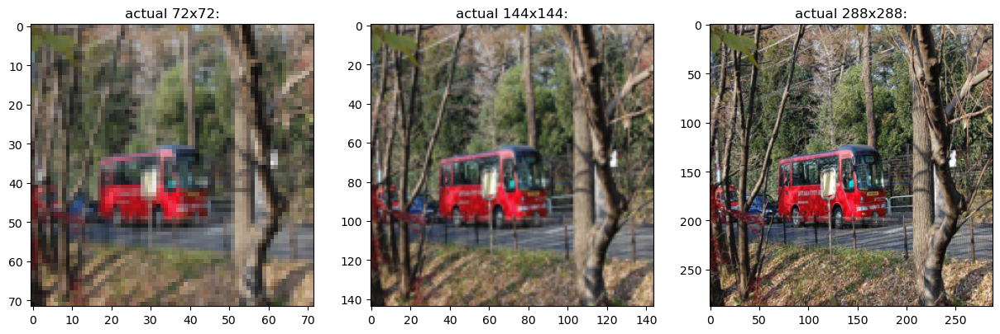

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


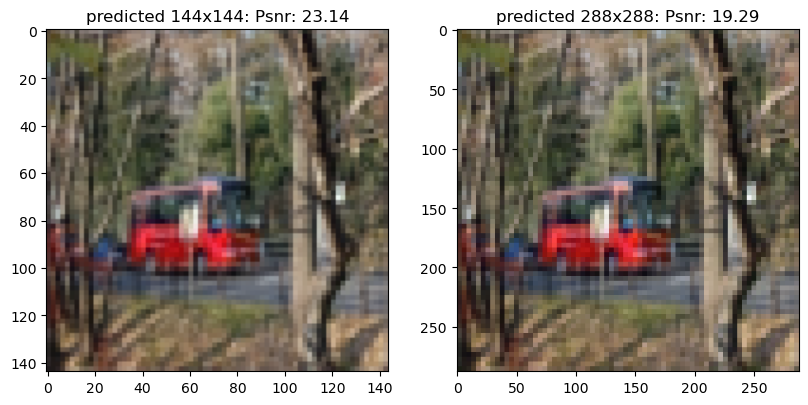

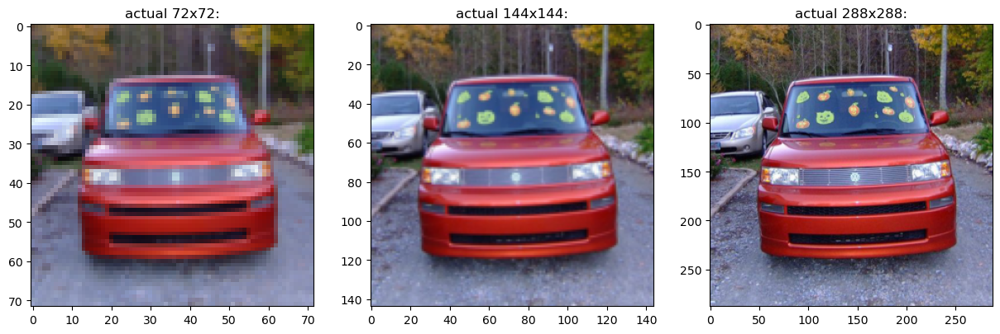

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


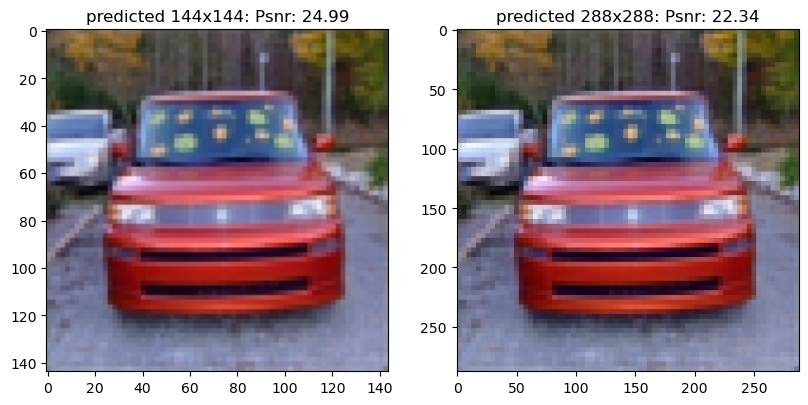

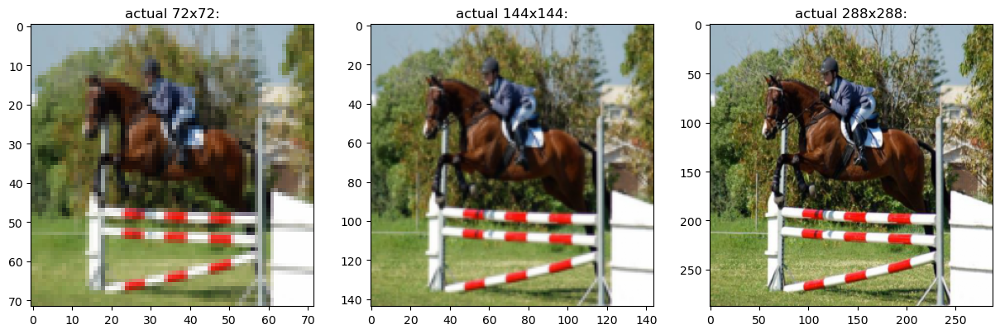

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


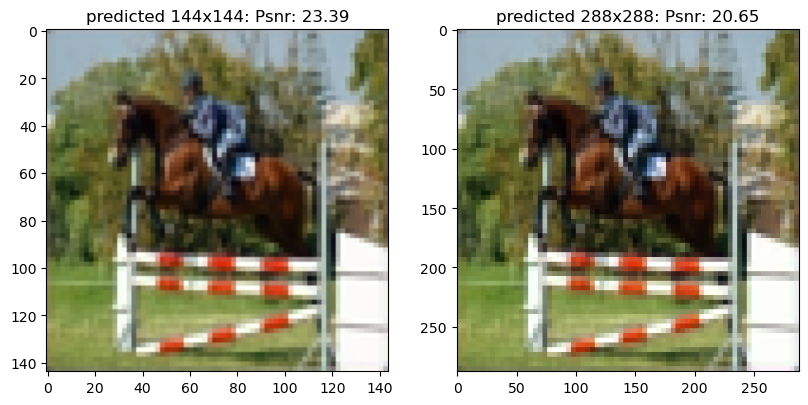

In [226]:
visualize_model_288(model72To288, test_dataset)

## Step 4 Residual Block

In [227]:
class ResidualBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(ResidualBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_dim, out_dim, 3, padding='same')
        
        self.conv2 = nn.Conv2d(in_dim, out_dim, 3, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

        
    def forward(self, x):

        output = self.conv1(x)
        output = self.conv2(output)
    
        return self.leakyRelu(output + x)
    
class FullConvWithResidualBlock(nn.Module):
    def __init__(self):
        super(FullConvWithResidualBlock, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 32, 3, padding='same')
        
        self.residualBlock1 = ResidualBlock(32,32)
        
        self.residualBlock2 = ResidualBlock(32,32)

        self.residualBlock3 = ResidualBlock(32,32)

        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        
        self.conv2 = nn.Conv2d(32, 3, 1, padding='same')
        
        self.conv3 = nn.Conv2d(32, 3, 1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

        
    def forward(self, x):
        
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        
        # 32x72x72        
        x = self.residualBlock1(x)
        
        # 32x72x72
        x = self.residualBlock2(x)
            
        # 32x72x72
        x = self.upsample(x)

        # 32x144x144
        x144 = self.conv2(x)
        # 3x144x144

        # 32x144x144
        x288 = self.residualBlock3(x)
        
        # 64x144x144
        x288 = self.upsample(x288)
  
        # 64x288x288
        x288 = self.conv3(x288)
        # 3x288x288
    
        return x144, x288
    
modelWithResidualBlock = FullConvWithResidualBlock().to(device)
modelWithResidualBlock

FullConvWithResidualBlock(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (residualBlock1): ResidualBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (leakyRelu): LeakyReLU(negative_slope=0.1)
  )
  (residualBlock2): ResidualBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (leakyRelu): LeakyReLU(negative_slope=0.1)
  )
  (residualBlock3): ResidualBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (leakyRelu): LeakyReLU(negative_slope=0.1)
  )
  (upsample): Upsample(scale_factor=2.0, mode=nearest)
  (conv2): Conv2d(32, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (conv3): Conv2d(32, 3, kernel_size=(1, 1), strid

In [230]:
learning_rate = 0.001
epochs = 3
batch_size = 64
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(modelWithResidualBlock.parameters(),lr=learning_rate)

In [232]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,modelWithResidualBlock,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,modelWithResidualBlock,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.199, 0 samples / 4011
loss=0.055, 1280 samples / 4011
loss=0.050, 2560 samples / 4011
loss=0.044, 3840 samples / 4011
Epoch:1/3 AVG Training Loss:0.121 AVG Val Loss:0.092
Starting epoch 2
loss=0.043, 0 samples / 4011
loss=0.042, 1280 samples / 4011
loss=0.041, 2560 samples / 4011
loss=0.040, 3840 samples / 4011
Epoch:2/3 AVG Training Loss:0.087 AVG Val Loss:0.085
Starting epoch 3
loss=0.040, 0 samples / 4011
loss=0.039, 1280 samples / 4011
loss=0.039, 2560 samples / 4011
loss=0.039, 3840 samples / 4011
Epoch:3/3 AVG Training Loss:0.083 AVG Val Loss:0.082


In [233]:
save_model_process('modelResidualBlock', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.05336868017911911, 1.1438442468643188]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.045472800731658936, 1.1115710735321045]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.030923902988433838, 1.102752447128296]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.009165182709693909, 1.235031247138977]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.07776014506816864, 1.1614567041397095]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.10334910452365875, 1.1173348426818848]. Convert image to uint8 prior to saving to suppress this warning.


In [340]:
evaluatePSNR(modelWithResidualBlock, test_dataset)

Average PSNR for 144x144: 25.771968841552734
Average PSNR for 288x288: 24.14771270751953


<Figure size 2600x4000 with 0 Axes>

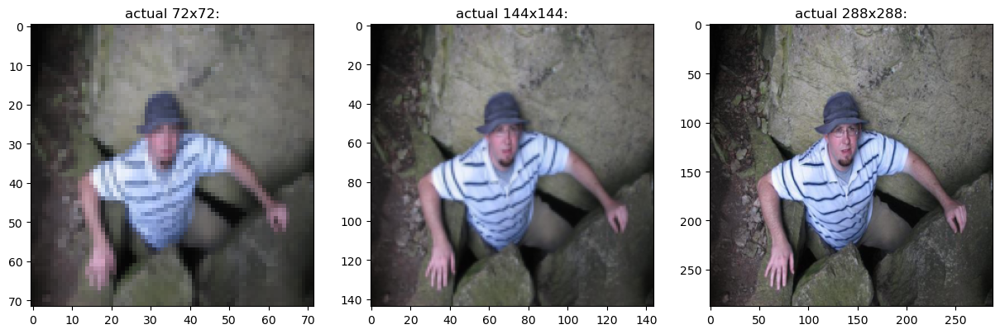

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


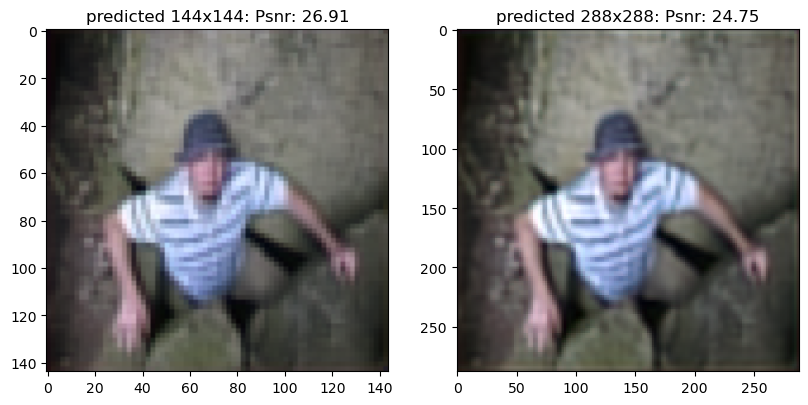

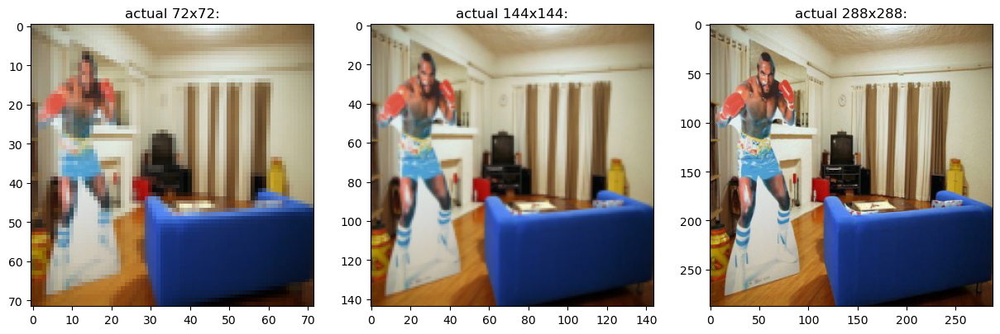

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


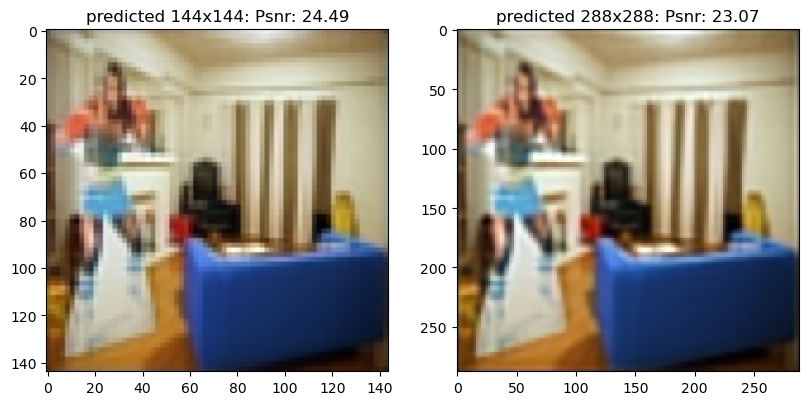

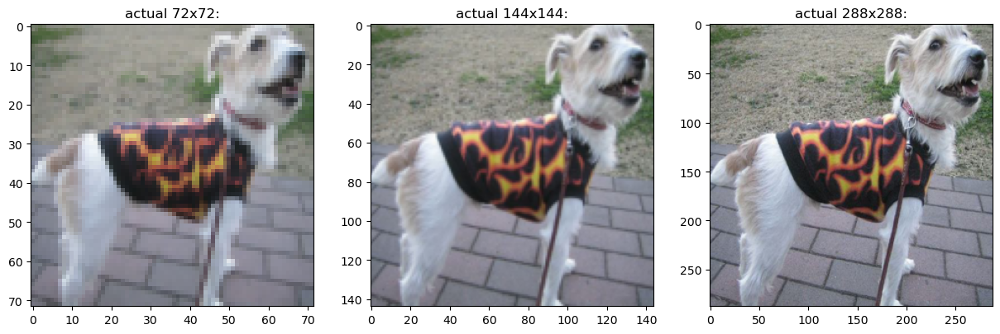

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


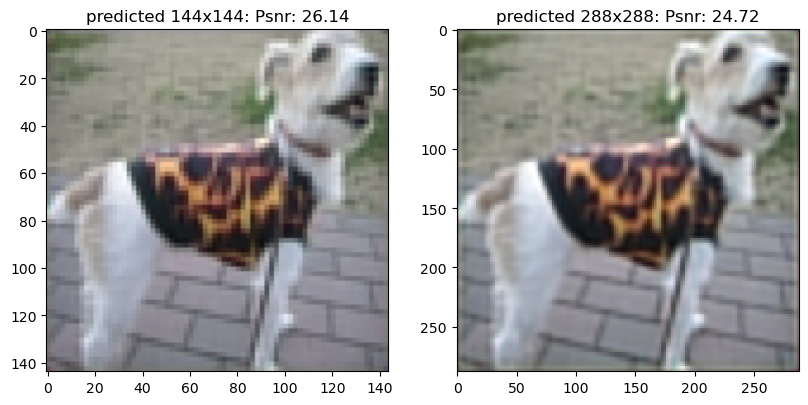

In [234]:
visualize_model_288(modelWithResidualBlock, test_dataset)

## Step 5 - Dialation Block

In [241]:
class DialationBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DialationBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=1)
        
        self.conv2 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=2)
        
        self.conv3 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=4)
            
        self.leakyRelu = nn.LeakyReLU(0.1)
        
        self.conv4 = nn.Conv2d(in_dim*3, out_dim, 3, padding='same')

        
    def forward(self, x):

        output1 = self.conv1(x)
        
        output2 = self.conv2(x)
        
        output3 = self.conv3(x)
        
        concatenated = self.leakyRelu(torch.cat((output1, output2, output3), 1))
        
        return self.conv4(concatenated)
    
class FullConvWithDialationBlock(nn.Module):
    def __init__(self):
        super(FullConvWithDialationBlock, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 32, 3, padding='same')
        
        self.dialation1 = DialationBlock(32,32)
        
        self.dialation2 = DialationBlock(32,32)

        self.dialation3 = DialationBlock(32,32)

        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        
        self.conv2 = nn.Conv2d(32, 3, 1,stride=1, padding='same')
        
        self.conv3 = nn.Conv2d(32, 3, 1,stride=1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

        
    def forward(self, x):
        
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        
        # 32x72x72        
        x = self.dialation1(x)
        
        # 32x72x72
        x = self.dialation2(x)
            
        # 32x72x72
        x = self.upsample(x)

        # 32x144x144
        x144 = self.conv2(x)
        # 3x144x144

        # 32x144x144
        x288 = self.dialation3(x)
        
        # 64x144x144
        x288 = self.upsample(x288)
  
        # 64x288x288
        x288 = self.conv3(x288)
        # 3x288x288
    
        return x144, x288
    
modelWithDialationBlock = FullConvWithDialationBlock().to(device)
modelWithDialationBlock

FullConvWithDialationBlock(
  (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (dialation1): DialationBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(2, 2))
    (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(4, 4))
    (leakyRelu): LeakyReLU(negative_slope=0.1)
    (conv4): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  )
  (dialation2): DialationBlock(
    (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(2, 2))
    (conv3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(4, 4))
    (leakyRelu): LeakyReLU(negative_slope=0.1)
    (conv4): Conv2d(96, 32, kernel_size=(3, 3), stride=(1, 1), padding=same)
  )
  (dialation3): DialationBlock(
    (conv1): Con

In [242]:
learning_rate = 0.001
epochs = 6
batch_size = 64
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(modelWithDialationBlock.parameters(),lr=learning_rate)

In [244]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,modelWithDialationBlock,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,modelWithDialationBlock,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.137, 0 samples / 4011
loss=0.070, 1280 samples / 4011
loss=0.057, 2560 samples / 4011
loss=0.052, 3840 samples / 4011
Epoch:1/6 AVG Training Loss:0.146 AVG Val Loss:0.106
Starting epoch 2
loss=0.050, 0 samples / 4011
loss=0.047, 1280 samples / 4011
loss=0.046, 2560 samples / 4011
loss=0.044, 3840 samples / 4011
Epoch:2/6 AVG Training Loss:0.097 AVG Val Loss:0.093
Starting epoch 3
loss=0.043, 0 samples / 4011
loss=0.042, 1280 samples / 4011
loss=0.042, 2560 samples / 4011
loss=0.041, 3840 samples / 4011
Epoch:3/6 AVG Training Loss:0.089 AVG Val Loss:0.087
Starting epoch 4
loss=0.040, 0 samples / 4011
loss=0.040, 1280 samples / 4011
loss=0.041, 2560 samples / 4011
loss=0.040, 3840 samples / 4011
Epoch:4/6 AVG Training Loss:0.085 AVG Val Loss:0.084
Starting epoch 5
loss=0.040, 0 samples / 4011
loss=0.040, 1280 samples / 4011
loss=0.040, 2560 samples / 4011
loss=0.039, 3840 samples / 4011
Epoch:5/6 AVG Training Loss:0.084 AVG Val Loss:0.083
Starting epoch 6
loss=0.0

In [245]:
save_model_process('modelDialationBlock', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.04937724769115448, 1.193628191947937]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.053306154906749725, 1.1293470859527588]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.07858085632324219, 1.1243716478347778]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.08142289519309998, 1.1469327211380005]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.08176906406879425, 1.1274693012237549]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.0587419793009758, 1.1020042896270752]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.0640365406870842, 1.2

In [341]:
evaluatePSNR(modelWithDialationBlock, test_dataset)

Average PSNR for 144x144: 25.729022979736328
Average PSNR for 288x288: 24.293262481689453


<Figure size 2600x4000 with 0 Axes>

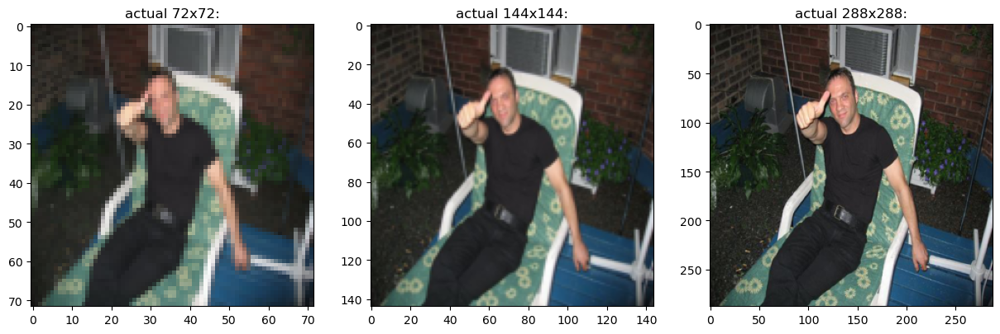

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


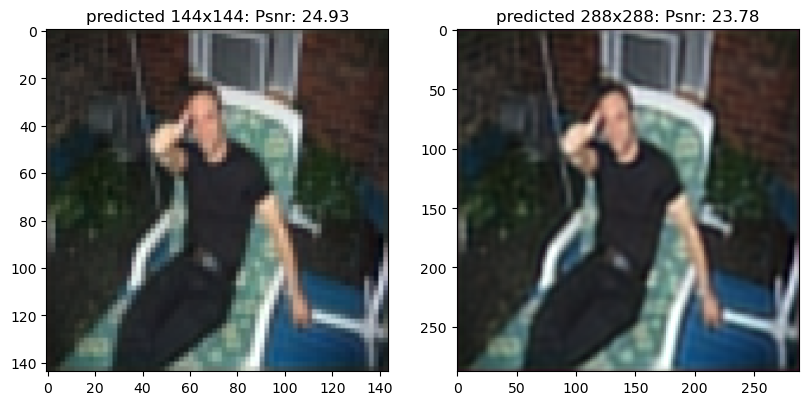

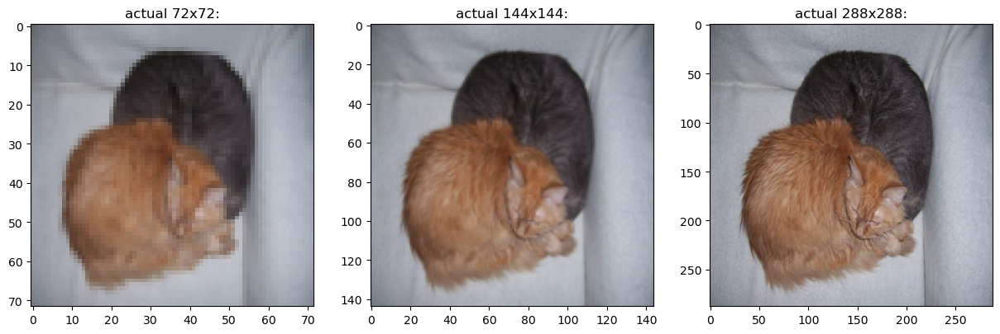

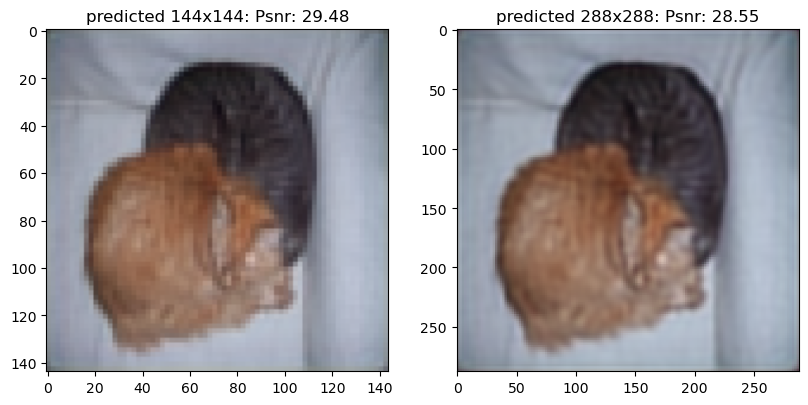

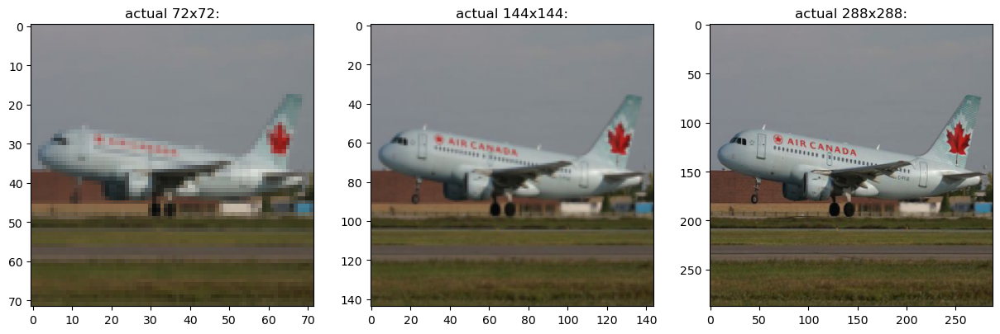

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


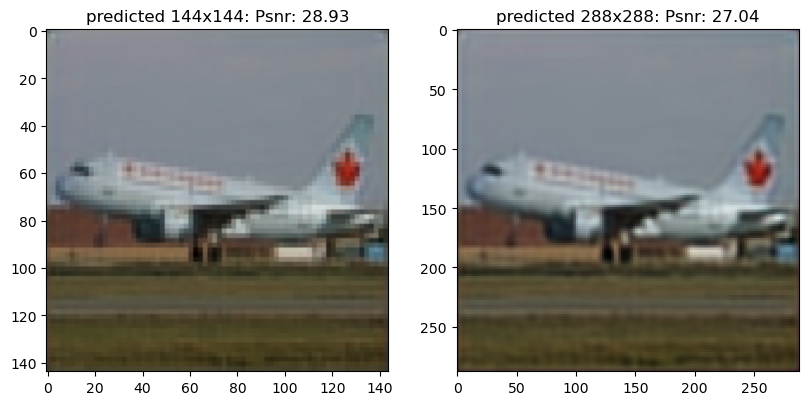

In [246]:
visualize_model_288(modelWithDialationBlock, test_dataset)

## Step 6 - Feature Extractor

In [247]:
from torchvision.models import vgg16

vgg16 = vgg16(pretrained=True)
vgg16 = (list(vgg16.children())[:-1])[0][:4]
for param in vgg16.parameters():
    param.requires_grad = False

In [256]:
class FullConvWithFeatureExtractor(nn.Module):
    def __init__(self, modelvgg16):
        super(FullConvWithFeatureExtractor, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 64, 3, padding='same')
        # convolutional layer (sees 64x72x72 tensor)
        self.conv2 = nn.Conv2d(64, 64, 3, padding='same')
        # output tensor size is 64x72x72
        
        self.featureExtractor = modelvgg16
        
        self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
        
        self.conv3 = nn.Conv2d(128, 3, 1,stride=1, padding='same')
        
        self.conv4 = nn.Conv2d(128, 3, 1,stride=1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

        
    def forward(self, x):
        
        features = self.featureExtractor(x)
        
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        
        # 64x72x72        
        x = self.leakyRelu(self.conv2(x))
        
        x = self.leakyRelu(torch.cat((x, features), 1))
            
        # 128x72x72
        x = self.upsample(x)

        # 128x144x144
        x144 = self.conv3(x)

        # 128x144x144
        x288 = self.upsample(x)
  
        # 128x288x288
        x288 = self.conv4(x288)
        # 3x288x288
    
        return x144, x288
    
modelWithFeatureExtractor = FullConvWithFeatureExtractor(vgg16).to(device)
modelWithFeatureExtractor

FullConvWithFeatureExtractor(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (featureExtractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (upsample): Upsample(scale_factor=2.0, mode=nearest)
  (conv3): Conv2d(128, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (conv4): Conv2d(128, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (leakyRelu): LeakyReLU(negative_slope=0.1)
)

In [257]:
learning_rate = 0.001
epochs = 6
batch_size = 16
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(modelWithFeatureExtractor.parameters(),lr=learning_rate)

In [259]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,modelWithFeatureExtractor,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,modelWithFeatureExtractor,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.183, 0 samples / 4011
loss=0.056, 320 samples / 4011
loss=0.047, 640 samples / 4011
loss=0.042, 960 samples / 4011
loss=0.041, 1280 samples / 4011
loss=0.042, 1600 samples / 4011
loss=0.039, 1920 samples / 4011
loss=0.039, 2240 samples / 4011
loss=0.039, 2560 samples / 4011
loss=0.040, 2880 samples / 4011
loss=0.038, 3200 samples / 4011
loss=0.039, 3520 samples / 4011
loss=0.038, 3840 samples / 4011
Epoch:1/6 AVG Training Loss:0.093 AVG Val Loss:0.081
Starting epoch 2
loss=0.039, 0 samples / 4011
loss=0.037, 320 samples / 4011
loss=0.038, 640 samples / 4011
loss=0.037, 960 samples / 4011
loss=0.038, 1280 samples / 4011
loss=0.039, 1600 samples / 4011
loss=0.038, 1920 samples / 4011
loss=0.038, 2240 samples / 4011
loss=0.038, 2560 samples / 4011
loss=0.039, 2880 samples / 4011
loss=0.037, 3200 samples / 4011
loss=0.039, 3520 samples / 4011
loss=0.038, 3840 samples / 4011
Epoch:2/6 AVG Training Loss:0.081 AVG Val Loss:0.081
Starting epoch 3
loss=0.039, 0 samples /

In [260]:
save_model_process('modelFeatureExtractor', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.02760547399520874, 1.019124150276184]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.013442538678646088, 0.9964261651039124]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.00018053129315376282, 0.980624258518219]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.04183227941393852, 0.983615517616272]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from 

In [342]:
evaluatePSNR(modelWithFeatureExtractor, test_dataset)

Average PSNR for 144x144: 27.043474197387695
Average PSNR for 288x288: 24.33807945251465


<Figure size 2600x4000 with 0 Axes>

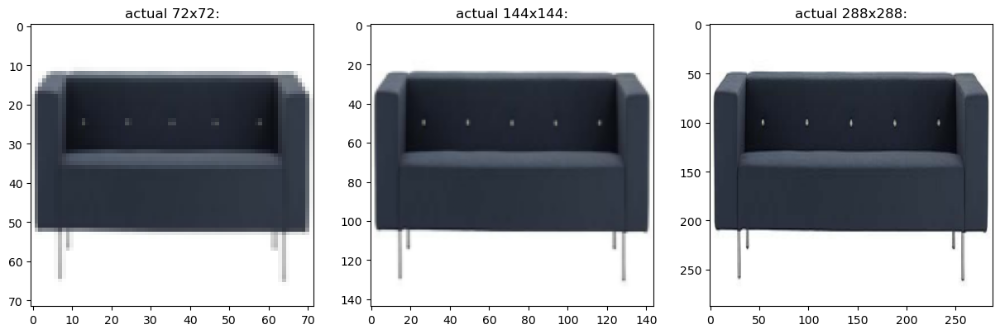

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


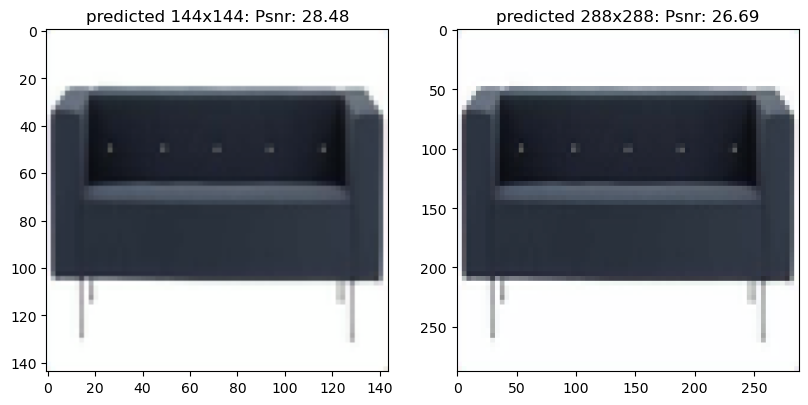

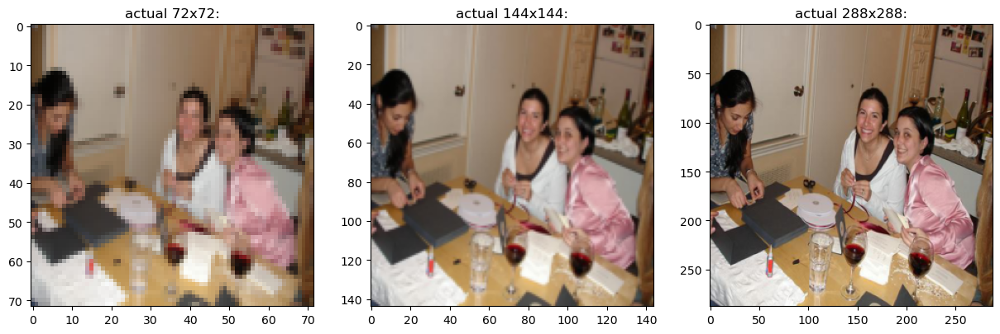

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


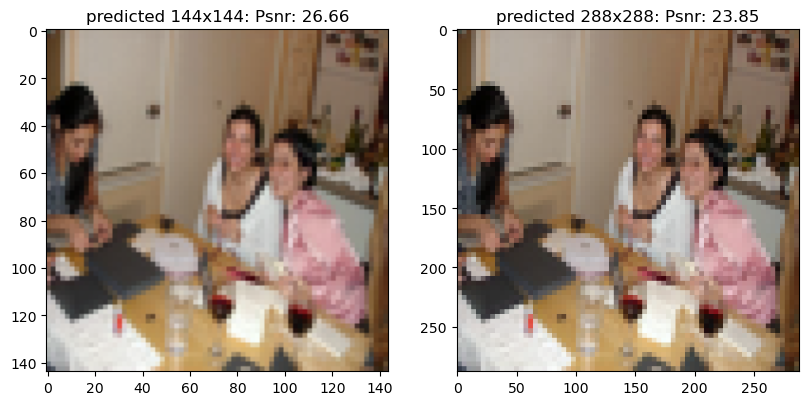

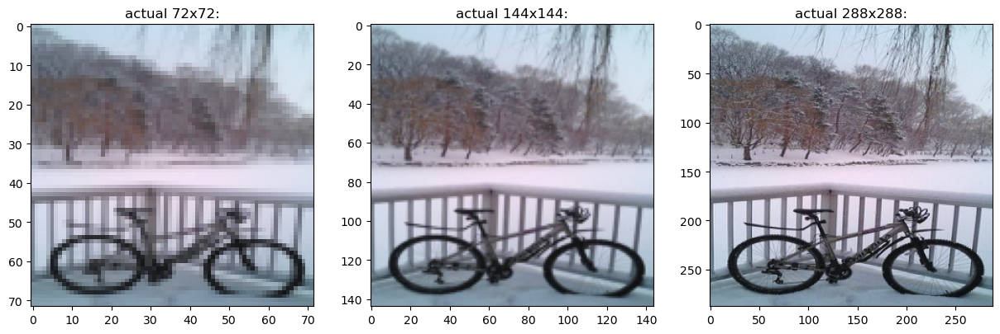

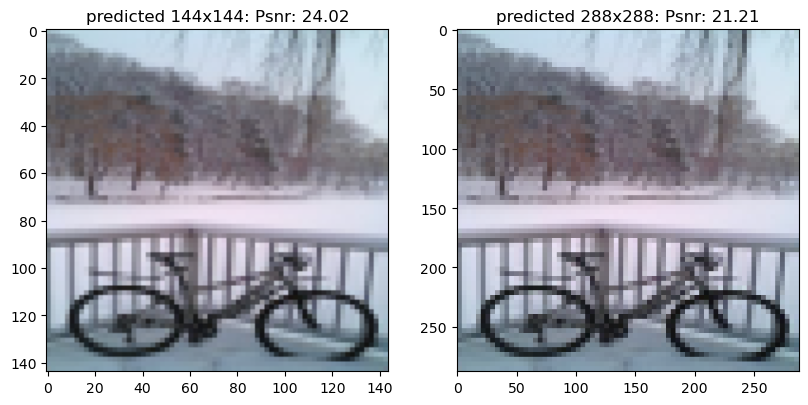

In [261]:
visualize_model_288(modelWithFeatureExtractor, test_dataset)

## Step 7 Pixel  Shuffle

In [262]:
from torchvision.models import vgg16

vgg16 = vgg16(pretrained=True)
vgg16 = (list(vgg16.children())[:-1])[0][:4]
for param in vgg16.parameters():
    param.requires_grad = False

In [263]:
class FullConvWithPixelShuffle(nn.Module):
    def __init__(self, modelvgg16):
        super(FullConvWithPixelShuffle, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 64, 3, padding='same')
        # convolutional layer (sees 64x72x72 tensor)
        self.conv2 = nn.Conv2d(64, 64, 3, padding='same')
        # output tensor size is 64x72x72
        
        self.featureExtractor = modelvgg16
        
        self.upsample = torch.nn.PixelShuffle(2)
        
        self.conv3 = nn.Conv2d(32, 3, 1,stride=1, padding='same')
        
        self.conv4 = nn.Conv2d(8, 3, 1,stride=1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.1)

        
    def forward(self, x):
        
        features = self.featureExtractor(x)
        
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        
        # 64x72x72        
        x = self.leakyRelu(self.conv2(x))
        
        x = self.leakyRelu(torch.cat((x, features), 1))
            
        # 128x72x72
        x = self.upsample(x)

        # 32x144x144
        x144 = self.conv3(x)

        # 32x144x144
        x288 = self.upsample(x)
  
        # 8x288x288
        x288 = self.conv4(x288)
        # 3x288x288
    
        return x144, x288
    
modelWithPixelShuffle = FullConvWithPixelShuffle(vgg16).to(device)
modelWithPixelShuffle

FullConvWithPixleShuffle(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (featureExtractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
  )
  (upsample): PixelShuffle(upscale_factor=2)
  (conv3): Conv2d(32, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (conv4): Conv2d(8, 3, kernel_size=(1, 1), stride=(1, 1), padding=same)
  (leakyRelu): LeakyReLU(negative_slope=0.1)
)

In [264]:
learning_rate = 0.001
epochs = 6
batch_size = 16
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(modelWithPixleShuffle.parameters(),lr=learning_rate)

In [265]:
import gc
torch.cuda.empty_cache()
gc.collect()

45998

In [266]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,modelWithPixleShuffle,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,modelWithPixleShuffle,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.217, 0 samples / 4011
loss=0.080, 1280 samples / 4011
loss=0.060, 2560 samples / 4011
loss=0.051, 3840 samples / 4011
Epoch:1/6 AVG Training Loss:0.179 AVG Val Loss:0.122
Starting epoch 2
loss=0.049, 0 samples / 4011
loss=0.045, 1280 samples / 4011
loss=0.042, 2560 samples / 4011
loss=0.040, 3840 samples / 4011
Epoch:2/6 AVG Training Loss:0.108 AVG Val Loss:0.097
Starting epoch 3
loss=0.039, 0 samples / 4011
loss=0.038, 1280 samples / 4011
loss=0.038, 2560 samples / 4011
loss=0.037, 3840 samples / 4011
Epoch:3/6 AVG Training Loss:0.092 AVG Val Loss:0.088
Starting epoch 4
loss=0.037, 0 samples / 4011
loss=0.036, 1280 samples / 4011
loss=0.037, 2560 samples / 4011
loss=0.036, 3840 samples / 4011
Epoch:4/6 AVG Training Loss:0.086 AVG Val Loss:0.085
Starting epoch 5
loss=0.037, 0 samples / 4011
loss=0.036, 1280 samples / 4011
loss=0.036, 2560 samples / 4011
loss=0.036, 3840 samples / 4011
Epoch:5/6 AVG Training Loss:0.083 AVG Val Loss:0.081
Starting epoch 6
loss=0.0

In [267]:
save_model_process('modelPixleShuffle', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.2878913879394531, 1.484550952911377]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.21752195060253143, 1.247040867805481]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.1168673038482666, 1.215328335762024]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.0758904218673706, 1.2212553024291992]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.07680413872003555, 1.164570927619934]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.06597840785980225, 1.1854000091552734]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.6373405456542969, 1.6273972

In [444]:
evaluatePSNR(modelWithPixleShuffle, test_dataset)

Average PSNR for 144x144: 7.641322135925293
Average PSNR for 288x288: 11.150514602661133


<Figure size 2600x4000 with 0 Axes>

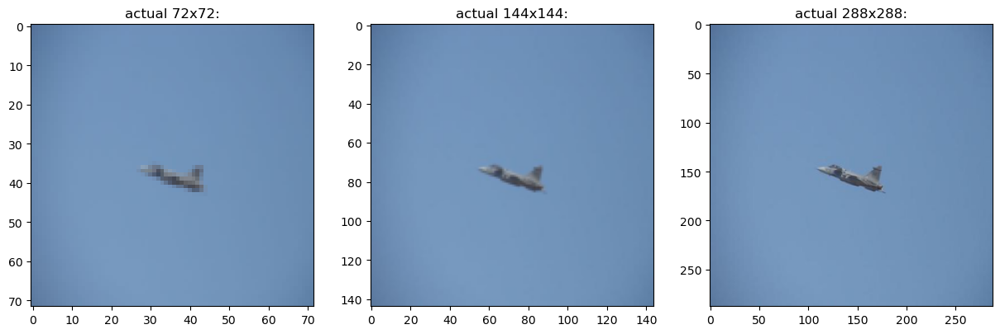

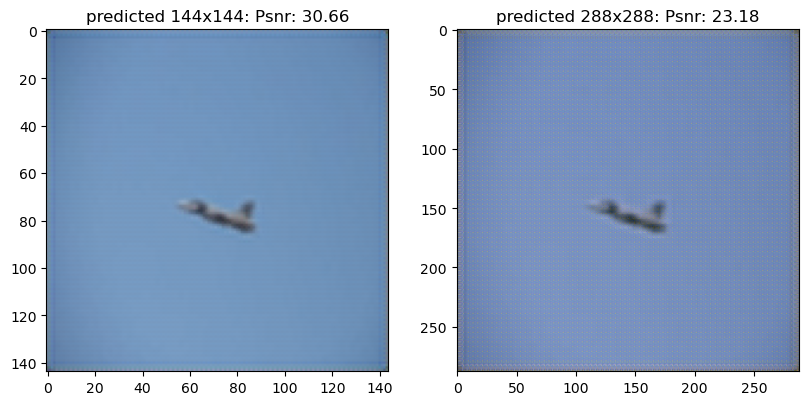

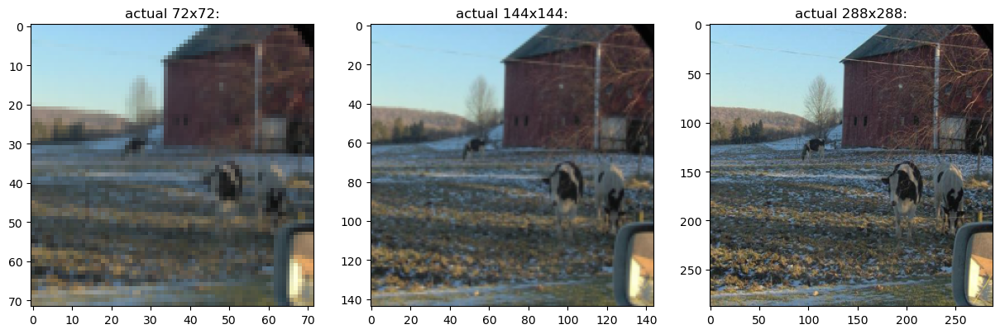

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


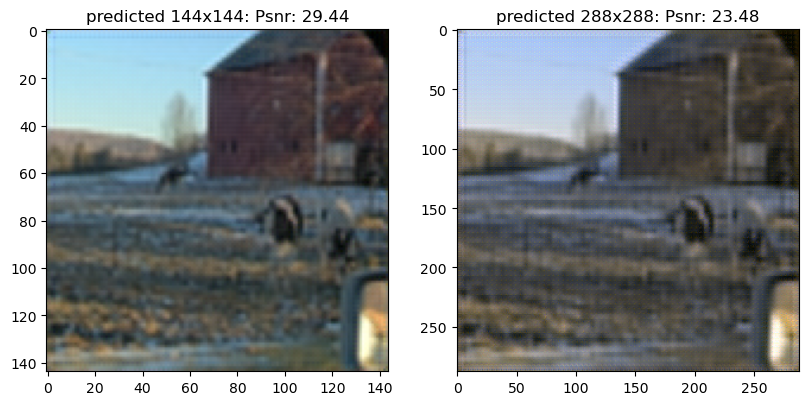

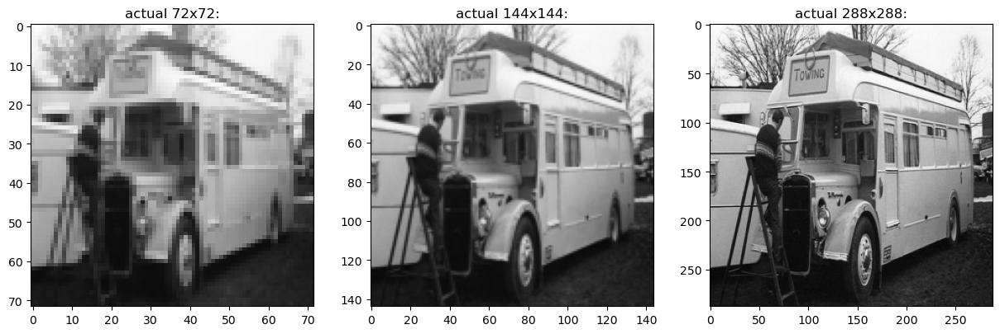

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


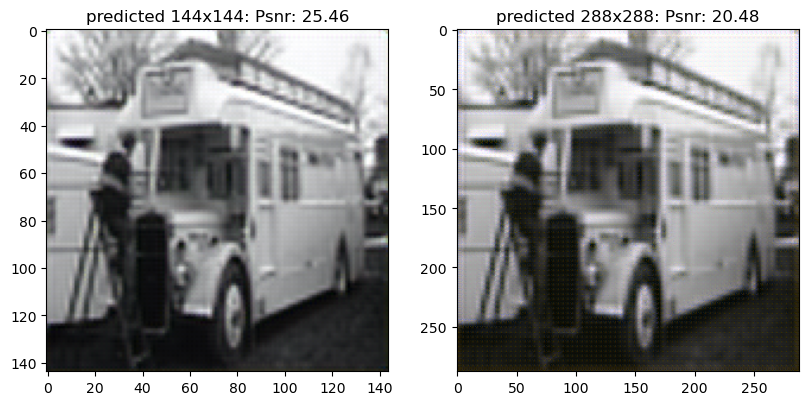

In [268]:
visualize_model_288(modelWithPixleShuffle, test_dataset)

## Final Model

In [38]:
from torchvision.models import vgg16

vgg16 = vgg16(pretrained=True)
vgg16 = (list(vgg16.children())[:-1])[0][:4]
for param in vgg16.parameters():
    param.requires_grad = False

In [39]:
class DialationBlock(nn.Module):
    def __init__(self, in_dim, out_dim):
        super(DialationBlock, self).__init__()

        self.conv1 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=1)
        
        self.conv2 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=2)
        
        self.conv3 = nn.Conv2d(in_dim, out_dim, 3, padding='same', dilation=4)
            
        self.leakyRelu = nn.LeakyReLU(0.01)
        
        self.conv4 = nn.Conv2d(in_dim*3, out_dim, 3, padding='same')

        
    def forward(self, x):

        output1 = self.conv1(x)
        
        output2 = self.conv2(x)
        
        output3 = self.conv3(x)
        
        concatenated = self.leakyRelu(torch.cat((output1, output2, output3), 1))
        
        return self.conv4(concatenated)

class FinalModel(nn.Module):
    def __init__(self, modelvgg16):
        super(FinalModel, self).__init__()
        # convolutional layer (sees 3x72x72 image tensor)
        self.conv1 = nn.Conv2d(3, 64, 3, padding='same')
        
        self.dialation1 = DialationBlock(64,64)
        
        self.dialation2 = DialationBlock(64,64)
        
        self.dialation3 = DialationBlock(32,32)
        
        self.dialation4 = DialationBlock(8,8)
        
        self.featureExtractor = modelvgg16
        
        self.upsample = nn.PixelShuffle(2)
        
        self.conv3 = nn.Conv2d(32, 3, 3,stride=1, padding='same')
        
        self.conv4 = nn.Conv2d(8, 3, 3,stride=1, padding='same')
        
        self.leakyRelu = nn.LeakyReLU(0.01)

        
    def forward(self, x):
        
        features = self.featureExtractor(x)
        
        # 3x72x72
        x = self.leakyRelu(self.conv1(x))
        
        x = self.dialation1(x)
        
        x = self.dialation2(x)
        
        x = self.leakyRelu(torch.cat((x, features), 1))
            
        # 128x72x72
        x = self.upsample(x)
        
        # 32x144x144
        x = self.dialation3(x)
            
        # 32x144x144
        x144 = self.conv3(x)

        # 32x144x144
        x288 = self.upsample(x)
  
        # 8x288x288
        x288 = self.dialation4(x288)
        
        # 8x288x288
        x288 = self.conv4(x288)
        # 3x288x288
    
        return x144, x288
    
finalModel = FinalModel(vgg16).to(device)
finalModel

FinalModel(
  (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  (dialation1): DialationBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(2, 2))
    (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(4, 4))
    (leakyRelu): LeakyReLU(negative_slope=0.01)
    (conv4): Conv2d(192, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  )
  (dialation2): DialationBlock(
    (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
    (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(2, 2))
    (conv3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=same, dilation=(4, 4))
    (leakyRelu): LeakyReLU(negative_slope=0.01)
    (conv4): Conv2d(192, 64, kernel_size=(3, 3), stride=(1, 1), padding=same)
  )
  (dialation3): DialationBlock(
    (conv1): Conv2d(32, 32, 

In [40]:
# was not used 
class PSNRL1Loss(nn.Module):
    def __init__(self, psnrRatio):
        super(PSNRL1Loss, self).__init__()
        
        self.loss_fun1 = PSNRLoss(psnrRatio)
        self.loss_fun2 = nn.L1Loss()
        
    def __call__(self, predictions, target):
        loss1  = self.loss_fun1(predictions, target)
        loss2  = self.loss_fun2(predictions, target)
        return loss1 + loss2


In [45]:
learning_rate = 0.001
epochs = 15
batch_size = 16
loss_fn = PSNRLoss(1)
optimizer = torch.optim.Adam(finalModel.parameters(),lr=learning_rate)

In [46]:
import gc
torch.cuda.empty_cache()
gc.collect()
results = {}
images144 = []
images288 = []

history = {'train_loss': [], 'test_loss': [],'train_acc':[],'test_acc':[]}


train_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(train_dataset,batch_size=batch_size)

for epoch in range(epochs):
    print(f'Starting epoch {epoch+1}')

    # train epoch
    train_epoch_loss = train_loop(train_loader,finalModel,device,loss_fn,optimizer)


    val_loss, valImg144, valImg288 = val_loop(test_loader,finalModel,device,loss_fn)


    print("Epoch:{}/{} AVG Training Loss:{:.3f} AVG Val Loss:{:.3f}".format(epoch + 1,
                                                                          epochs,
                                                                          train_epoch_loss,
                                                                          val_loss,                                                                               
                                                                            ))
    history['train_loss'].append(train_epoch_loss.detach().cpu().numpy())
    history['test_loss'].append(val_loss)
    images144.append(valImg144)
    images288.append(valImg288)
    


Starting epoch 1
loss=0.034, 0 samples / 4011
loss=0.032, 320 samples / 4011
loss=0.033, 640 samples / 4011
loss=0.032, 960 samples / 4011
loss=0.033, 1280 samples / 4011
loss=0.034, 1600 samples / 4011
loss=0.033, 1920 samples / 4011
loss=0.033, 2240 samples / 4011
loss=0.033, 2560 samples / 4011
loss=0.033, 2880 samples / 4011
loss=0.033, 3200 samples / 4011
loss=0.034, 3520 samples / 4011
loss=0.033, 3840 samples / 4011
Epoch:1/15 AVG Training Loss:0.072 AVG Val Loss:0.072
Starting epoch 2
loss=0.034, 0 samples / 4011
loss=0.032, 320 samples / 4011
loss=0.032, 640 samples / 4011
loss=0.032, 960 samples / 4011
loss=0.033, 1280 samples / 4011
loss=0.034, 1600 samples / 4011
loss=0.032, 1920 samples / 4011
loss=0.033, 2240 samples / 4011
loss=0.033, 2560 samples / 4011
loss=0.033, 2880 samples / 4011
loss=0.033, 3200 samples / 4011
loss=0.034, 3520 samples / 4011
loss=0.033, 3840 samples / 4011
Epoch:2/15 AVG Training Loss:0.072 AVG Val Loss:0.072
Starting epoch 3
loss=0.034, 0 samples

In [421]:
save_model_process('finalModel', images144, images288)

Lossy conversion from float32 to uint8. Range [-0.02891191653907299, 1.0549187660217285]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.03434957563877106, 1.076814889907837]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.03648047894239426, 1.0418611764907837]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.008820317685604095, 1.0396316051483154]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.017946358770132065, 1.075047254562378]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.014996569603681564, 1.0401434898376465]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float32 to uint8. Range [-0.010027643293142319,

In [47]:
evaluatePSNR(finalModel, test_dataset)

Average PSNR for 144x144: 31.39800453186035
Average PSNR for 288x288: 27.1969051361084


<Figure size 2600x4000 with 0 Axes>

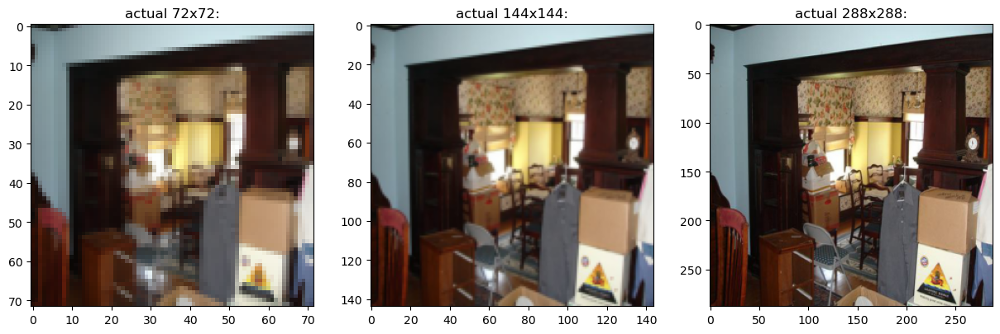

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


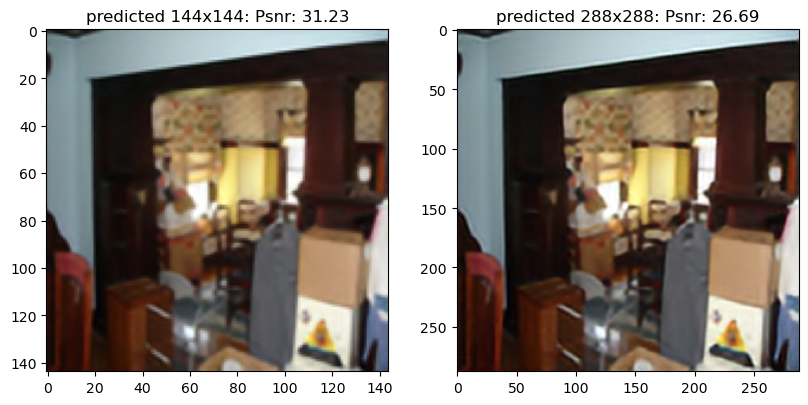

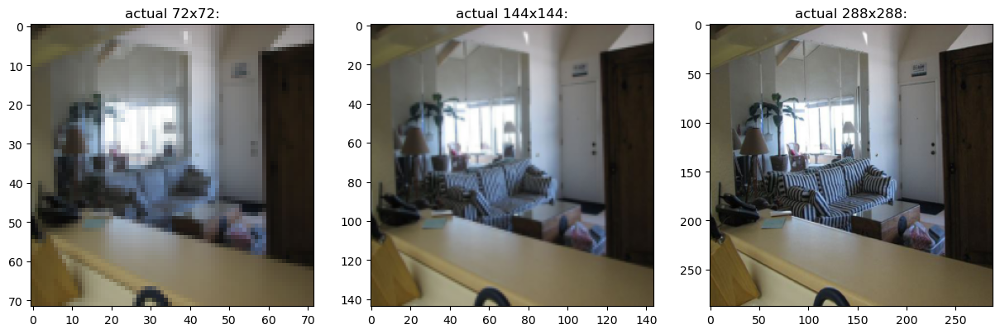

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


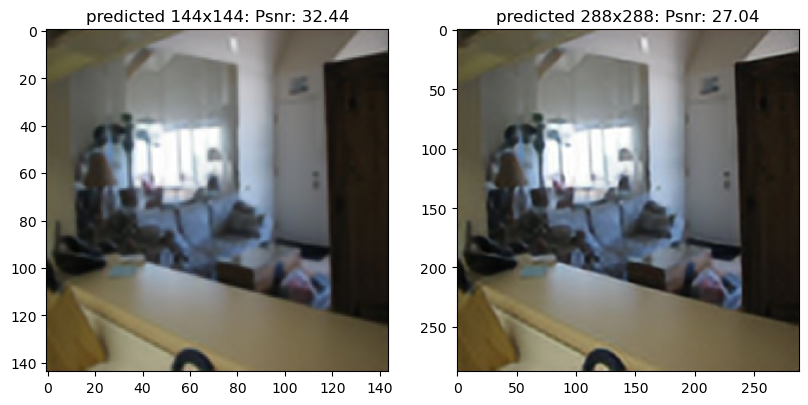

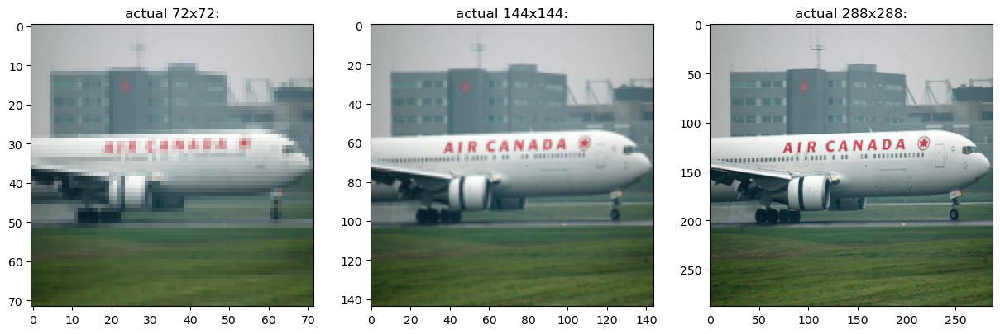

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


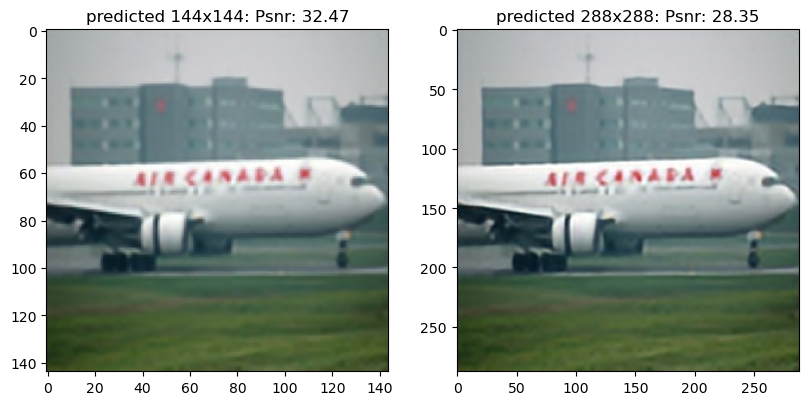

In [52]:
visualize_model_288(finalModel, test_dataset)